# SITCOM-720: Study of blended donuts

Author: Bryce Kalmbach

Date: 10-27-2023

Software Versions:

`lsst_distrib`: `w_2023_37`

`ts_wep`: 8.0.1

This notebook looks at how WEP performs when working on blended donuts compared to isolated donuts.

In [1]:
from copy import copy, deepcopy
from lsst.daf.butler import Butler
import matplotlib as mpl
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.visualization import ZScaleInterval
from IPython.display import Image
from lsst.ts.wep.utils import ConvertZernikesToPsfWidth
%matplotlib inline

## Get AuxTel raw data

Get the latest AuxTel data found in `/repo/embargo`

In [2]:
repo_dir = '/sdf/group/rubin/repo/embargo/'

In [3]:
butler = Butler(repo_dir)

### Find the data.

Our data for the night consisted of the following tests ([night log](https://confluence.lsstcorp.org/display/LSSTCOM/2023-03-10+AuxTel+Night+Log), [RubinTV](https://roundtable.lsst.codes/rubintv/summit/auxtel/historical/2023-03-10)):

| Test | Prefix in Observation Reason Metadata | Sequence Numbers |
| --- | --- | --- |
| Sensitivity Matrix Field 1, x/y offsets | intra/extra_aos_sm_offset | 33-52 |
| Sensitivity Matrix Field 1, rx/ry offsets | intra/extra_aos_pointing_offset | 53-67 |
| Sensitivity Matrix Field 2, x/y, rx/ry, z, m1 offsets | intra/extra_aos_sm_offset | 71-211 |
| Exposure Time | intra/extra_aos_exposure_time | 215-228 |
| Double Stars Field 1 | intra/extra_aos_double_stars_dun_149 | 248-255 |
| Double Stars Field 1 | intra/extra_aos_double_stars_hj_561 | 256-259 |
| Giant Donuts 4mm Defocus | intra/extra_aos_giant_donut_hj_561_dz_4mm | 260-261 |
| Giant Donuts 6mm Defocus | intra/extra_aos_giant_donut_hj_561_dz_6mm | 262-263 |

The data has been processed with a default `ts_wep` configuration and is accessible in two different collections:
* `u/brycek/latiss_wep_test/run_all`
    * This collection has all of the pairs of data run with the `ts_wep` pipeline using only the brightest source in the image.
* `u/brycek/latiss_wep_test/run_all_full_catalog`
    * This collection is the same as above except the limit of only using a single source is removed and all sources identified by `GenerateDonutDirectDetectTask` 
      are included in the donut catalog and subsequent donut stamps and Zernike estimates.

When processing the data we took the data and paired up extra and intra-focal images with the following code:

In [4]:
output_collection = 'u/brycek/latiss_wep_test/run_all_full_catalog'
butler = Butler(
    "/repo/embargo",
    collections=[output_collection],
    instrument='LATISS'
)


records = list(
    butler.registry.queryDimensionRecords(
        "exposure",
        where="exposure.observation_type='cwfs' and exposure.day_obs=20230310"
    )
)
records.sort(key=lambda record: (record.day_obs, record.seq_num))

# Loop through and make pairs where 1st exposure is intra and second exposure is extra and have same group_id
# Save record information for each pair and sequence numbers for easy location later.
pairs = []
seq_nums = []
for record0, record1 in zip(records[:-1], records[1:]):
    if (
        record0.observation_reason.startswith('intra') and
        record1.observation_reason.startswith('extra') and
        record0.group_id == record1.group_id and
        not record0.physical_filter.startswith("empty")
    ):
        pairs.append((record0, record1))
        seq_nums.append(record0.seq_num)
seq_nums = np.array(seq_nums)

Here we create the full dataIds for the processed data by adding the detector and visit information into the exposure dataIds.

In [5]:
from copy import copy
dataIdPairs = []
for pair in pairs:
    dataId_intra = dict(pair[0].dataId)
    dataId_intra['visit'] = pair[0].dataId['exposure']
    dataId_intra['detector'] = 0
    
    dataId_extra = dict(pair[1].dataId)
    dataId_extra['visit'] = pair[1].dataId['exposure']
    dataId_extra['detector'] = 0
    
    dataIdPairs.append([dataId_intra, dataId_extra])
    

### Look at output stored in butler

In [6]:
# Reload butler to get new collection
butler = Butler(repo_dir)

In [7]:
# Pick the first of the exposure time fields since these have lots of stars
pair_idx = np.where(seq_nums == 223)[0][0]

In [8]:
# To make things clearer rename these data ids
data_id_intra = dataIdPairs[pair_idx][0]
data_id_extra = dataIdPairs[pair_idx][1]

### Load the postISR images and the `donutCatalog`

The `donutCatalog` is what we call the catalog we used to store the donut sources used to estimate the Zernikes in a run of the WEP pipeline. Since we chose the `'u/brycek/latiss_wep_test/run_all_full_catalog'` collection our `donutCatalogs` should have all sources bright enough to be detected in an initial run of `GenerateDonutDirectDetectTask`.

In [9]:
rawExtra = butler.get('raw', dataId=data_id_extra, collections=output_collection)
rawIntra = butler.get('raw', dataId=data_id_intra, collections=output_collection)

In [10]:
postIsrExtra = butler.get('postISRCCD', dataId=data_id_extra, collections=output_collection)
postIsrIntra = butler.get('postISRCCD', dataId=data_id_intra, collections=output_collection)

In [11]:
donutCatExtra = butler.get('donutCatalog', dataId=data_id_extra, collections=output_collection)
donutCatIntra = butler.get('donutCatalog', dataId=data_id_intra, collections=output_collection)

In [12]:
donutCatExtra

,coord_ra,coord_dec,centroid_x,centroid_y,detector,source_flux,blend_centroid_x,blend_centroid_y
0,2.306816,-0.684762,1965.629268,2212.671589,RXX_S00,2.910382e+08,[],[]
1,2.305866,-0.685119,517.104871,3216.541623,RXX_S00,4.476999e+06,[],[]
2,2.306805,-0.684354,2723.494812,2658.953143,RXX_S00,3.421002e+06,[],[]
3,2.308097,-0.684777,2985.898723,332.256788,RXX_S00,2.796512e+06,[],[]
4,2.306827,-0.685289,985.487885,1638.967432,RXX_S00,1.580994e+06,[],[]


In [13]:
donutCatIntra

,coord_ra,coord_dec,centroid_x,centroid_y,detector,source_flux,blend_centroid_x,blend_centroid_y
0,2.306821,-0.684760,1974.154659,2208.679614,RXX_S00,3.085084e+08,[],[]
1,2.305872,-0.685116,527.700192,3211.961748,RXX_S00,4.730117e+06,[],[]
2,2.306811,-0.684352,2732.662147,2654.933906,RXX_S00,3.676613e+06,[],[]
3,2.308101,-0.684775,2994.978159,331.037973,RXX_S00,3.206965e+06,[],[]
4,2.306832,-0.685287,993.943819,1636.272395,RXX_S00,1.674871e+06,[],[]
5,2.306092,-0.685327,312.155975,2668.526433,RXX_S00,6.669985e+05,[],[]
6,2.306219,-0.685162,726.976338,2659.200414,RXX_S00,6.049567e+05,[],[]
7,2.307586,-0.684790,2544.418665,1063.666024,RXX_S00,5.688059e+05,[],[]


Our catalogs for the extra-focal and intra-focal images contain multiple sources but since we set the defaults in our initial run we have no blended sources.

Text(0, 0.5, 'Y Pixels')

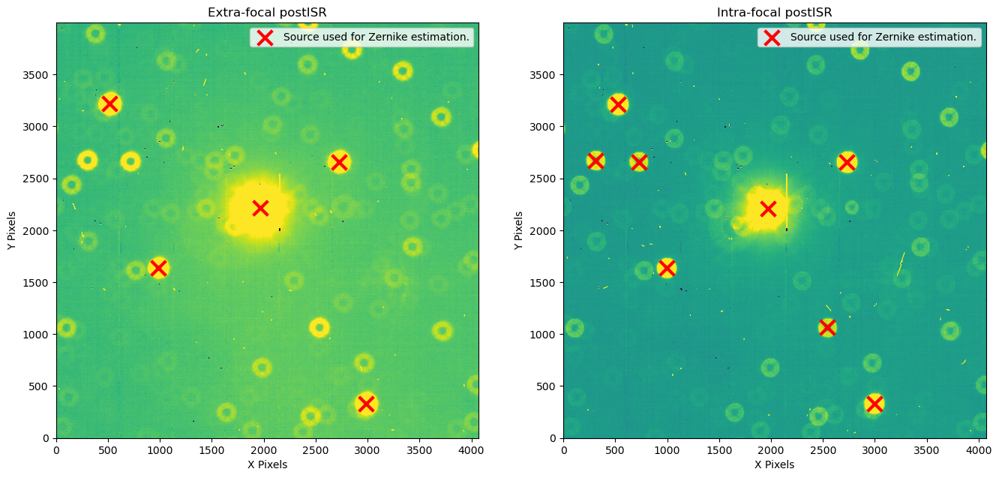

In [14]:
%matplotlib inline

fig=plt.figure(figsize=(16,8))

fig.add_subplot(1,2,1)
zscale_extra = ZScaleInterval().get_limits(postIsrExtra.image.array)
plt.imshow(postIsrExtra.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_extra[0], vmax=zscale_extra[1]), origin='lower')
plt.title('Extra-focal postISR')
plt.scatter(donutCatExtra['centroid_x'], donutCatExtra['centroid_y'], c='r', marker='x', lw=3, s=200, label="Source used for Zernike estimation.")
plt.legend()
plt.xlabel('X Pixels')
plt.ylabel('Y Pixels')

fig.add_subplot(1,2,2)
zscale_intra = ZScaleInterval().get_limits(postIsrIntra.image.array)
plt.imshow(postIsrIntra.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_intra[0], vmax=zscale_intra[1]), origin='lower')
plt.title('Intra-focal postISR')
plt.scatter(donutCatIntra['centroid_x'], donutCatIntra['centroid_y'], c='r', marker='x', lw=3, s=200, label="Source used for Zernike estimation.")
plt.legend()
plt.xlabel('X Pixels')
plt.ylabel('Y Pixels')

There are quite a few hot pixels in the current ISR set up we use. This JIRA ticket ([DM-38196](https://jira.lsstcorp.org/browse/DM-38196)) is working on fixing this.

## Re-run donut fitting

Our initial catalog was run without allowing blended sources.
Now we rerun catalog creation with the settings set to allow sources blended with 1 other donut.
We will also re-run `GenerateDonutDirectDetectTask` with a lower SNR threshold.

In [15]:
# Task
from lsst.ts.wep.task import GenerateDonutDirectDetectTaskConfig, GenerateDonutDirectDetectTask
config = GenerateDonutDirectDetectTaskConfig()
config.instObscuration = 0.3525
config.instFocalLength = 21.6
config.instApertureDiameter = 1.2
config.instDefocalOffset = 32.8
config.instPixelSize = 10.0e-6
config.opticalModel = 'onAxis'

In [16]:
config = GenerateDonutDirectDetectTaskConfig()
config.measurementTask.nSigmaDetection = 2. # The default used in the full run stored in the butler is 20.
config.initialCutoutPadding = 40
# Set auxTel parameters
config.instObscuration = 0.3525
config.instFocalLength = 21.6
config.instApertureDiameter = 1.2
config.instDefocalOffset = 32.8
config.instPixelSize = 10.0e-6
config.opticalModel = 'onAxis'
# Set donut selection parameters
config.donutSelector.useCustomMagLimit = True
config.donutSelector.unblendedSeparation = 160
config.donutSelector.maxBlended = 1
config.donutSelector.minBlendedSeparation = 0

In [17]:
camera = butler.get('camera', {'instrument': 'LATISS'}, collections='LATISS/calib/unbounded')

In [18]:
newTask = GenerateDonutDirectDetectTask(config=config)
auxTelCat = newTask.run(postIsrExtra, camera).donutCatalog

With these settings we are able to get a catalog of 25 sources.

Text(0, 0.5, 'Y Pixels')

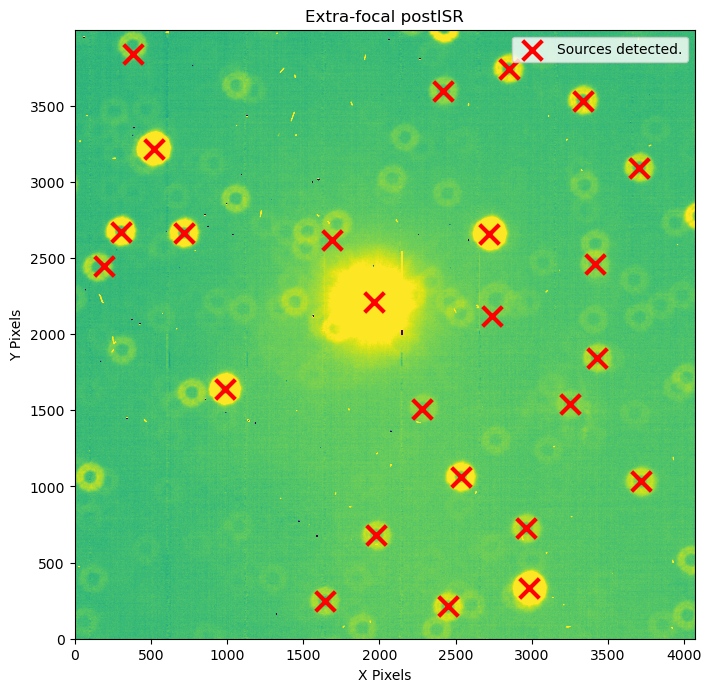

In [19]:
%matplotlib inline

fig=plt.figure(figsize=(8,8))

fig.add_subplot(1,1,1)
zscale_extra = ZScaleInterval().get_limits(postIsrExtra.image.array)
plt.imshow(postIsrExtra.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_extra[0], vmax=zscale_extra[1]), origin='lower')
plt.title('Extra-focal postISR')
plt.scatter(auxTelCat['centroid_x'], auxTelCat['centroid_y'], c='r', marker='x', lw=3, s=200, label="Sources detected.")
plt.legend()
plt.xlabel('X Pixels')
plt.ylabel('Y Pixels')

We now have a much larger catalog of sources.
Let's look at the catalog to see which sources have been marked as blended.

In [20]:
auxTelCat

,coord_ra,coord_dec,centroid_x,centroid_y,detector,source_flux,blend_centroid_x,blend_centroid_y
0,2.306815,-0.684762,1965.504747,2214.001659,RXX_S00,2.910382e+08,[],[]
1,2.305866,-0.685119,517.133165,3216.599263,RXX_S00,4.476999e+06,[],[]
2,2.306805,-0.684354,2723.270796,2658.725423,RXX_S00,3.421002e+06,[],[]
3,2.308097,-0.684777,2985.911251,332.414773,RXX_S00,2.796512e+06,[],[]
4,2.306828,-0.685289,985.978242,1638.386326,RXX_S00,1.580994e+06,[],[]
5,2.306087,-0.685331,300.538063,2671.061172,RXX_S00,5.900634e+05,[],[]
6,2.307582,-0.684793,2534.455933,1064.875739,RXX_S00,5.529665e+05,[],[]
7,2.306214,-0.685164,717.006318,2663.356958,RXX_S00,5.521189e+05,[],[]
8,2.306279,-0.684057,2849.707091,3738.941077,RXX_S00,3.357654e+05,[],[]
9,2.308002,-0.685020,2450.470459,214.330380,RXX_S00,2.998492e+05,[],[]


It looks like we have a single blended source (index=19).
The original plan for this data was to have a bright blend but something went wrong in our field selection so we will have to make do with the blended source we have.

Since we want to test the behavior of the blended source through the wavefront estimation pipeline we will cut out the donut stamps for the objects and then use those to calculate Zernikes.

### Cut Out DonutStamps for all sources

We use `CutOutDonutsScienceSensorTask` to make postage stamps of the sources that we store as `DonutStamp` objects.

In [21]:
from copy import copy
from lsst.ts.wep.task import CutOutDonutsScienceSensorTask, CutOutDonutsScienceSensorTaskConfig

In [22]:
cutOutConfig = CutOutDonutsScienceSensorTaskConfig()
cutOutConfig.instObscuration = 0.3525
cutOutConfig.instFocalLength = 21.6
cutOutConfig.instApertureDiameter = 1.2
cutOutConfig.instDefocalOffset = 32.8
cutOutConfig.instPixelSize = 10.0e-6
cutOutConfig.opticalModel = 'onAxis'
cutOutConfig.donutStampSize = 200
cutOutConfig.donutTemplateSize = 200
cutOutConfig.initialCutoutPadding = 40
cutOutConfig.maskGrowthIter = 1
cutOutConfig.multiplyMask = False

In [23]:
cutOutTask = CutOutDonutsScienceSensorTask(config=cutOutConfig)

In [24]:
stamps = cutOutTask.run([copy(postIsrExtra), copy(postIsrIntra)], [auxTelCat, auxTelCat], camera)

In [25]:
stampsExtra = stamps.donutStampsExtra
stampsIntra = stamps.donutStampsIntra

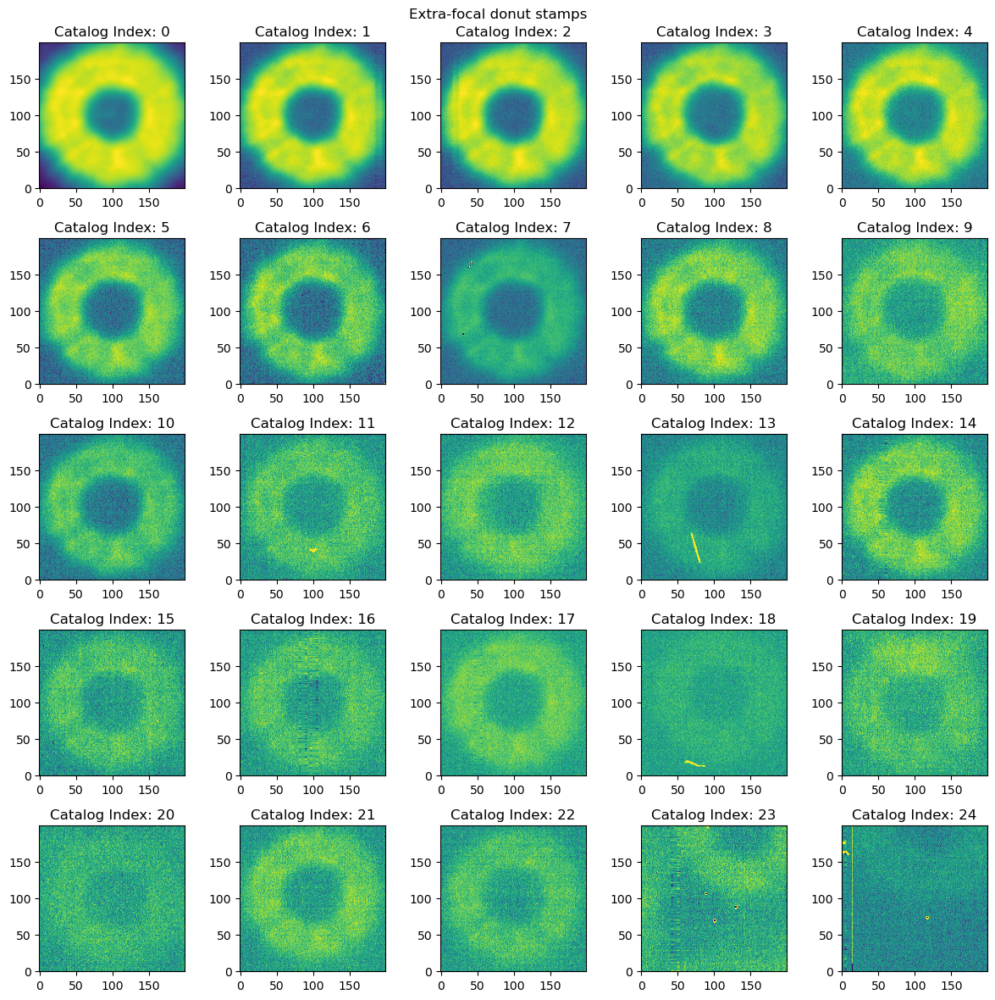

In [26]:
%matplotlib inline
fig = plt.figure(figsize=(12,12))
for i in range(25):
    fig.add_subplot(5,5,i+1)
    zscale_extra = ZScaleInterval().get_limits(stampsExtra[i].stamp_im.image.array)
    plt.imshow(stampsExtra[i].stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_extra[0], vmax=zscale_extra[1]), origin='lower')
    plt.title(f'Catalog Index: {i}')
plt.suptitle('Extra-focal donut stamps')
plt.tight_layout()

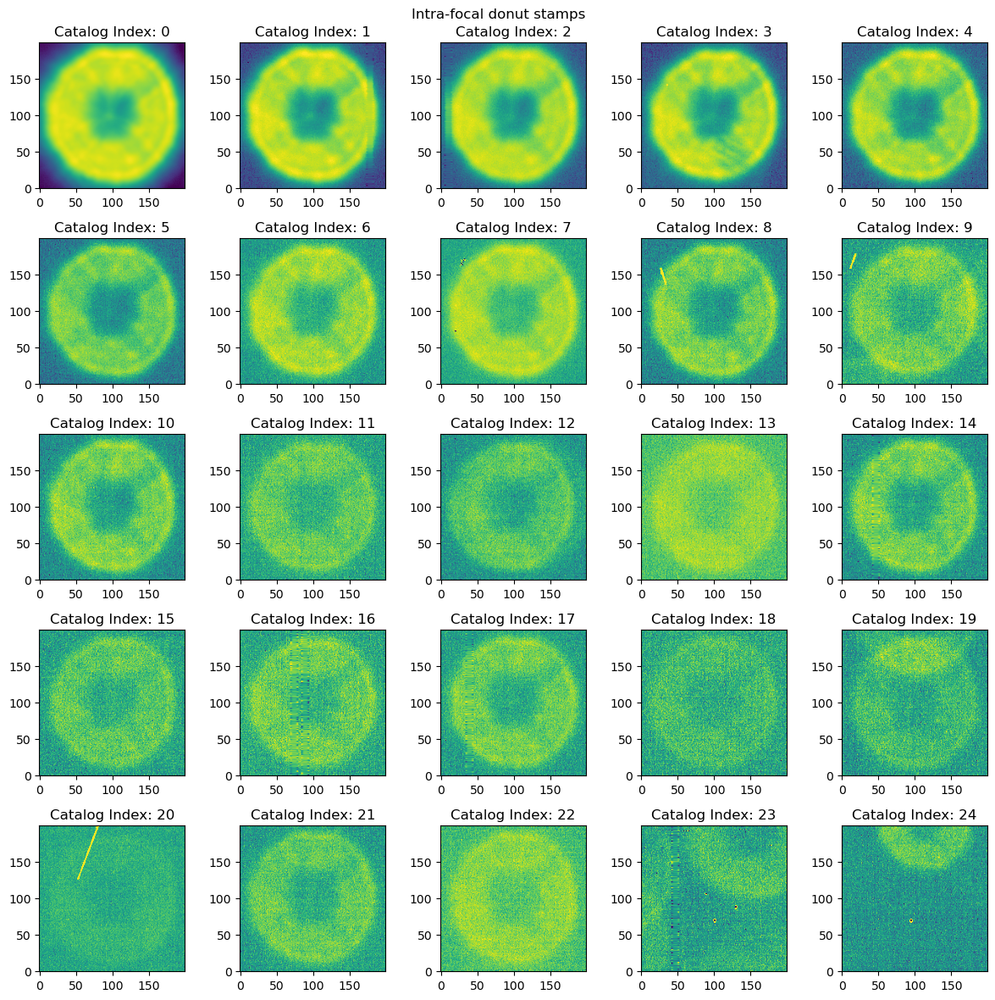

In [27]:
%matplotlib inline
fig = plt.figure(figsize=(12,12))
for i in range(25):
    fig.add_subplot(5,5,i+1)
    zscale_intra = ZScaleInterval().get_limits(stampsIntra[i].stamp_im.image.array)
    plt.imshow(stampsIntra[i].stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_intra[0], vmax=zscale_intra[1]), origin='lower')
    plt.title(f'Catalog Index: {i}')
plt.suptitle('Intra-focal donut stamps')
plt.tight_layout()

Looking at the postage stamps for our sources we see that they start to get get quite dim near the lower limit of detection. The good news is that our blended source (catalog index = 19) is clearly identifiable as a blend but is still well centered.

In [28]:
# Record index of blended objects and save individual stamp for blended object
blend_idx = [idx for idx in range(len(auxTelCat)) if len(auxTelCat.blend_centroid_x[idx]) == 1]
print(blend_idx)
blendStampExtra = copy(stampsExtra[blend_idx[0]])
blendStampIntra = copy(stampsIntra[blend_idx[0]])

[19]


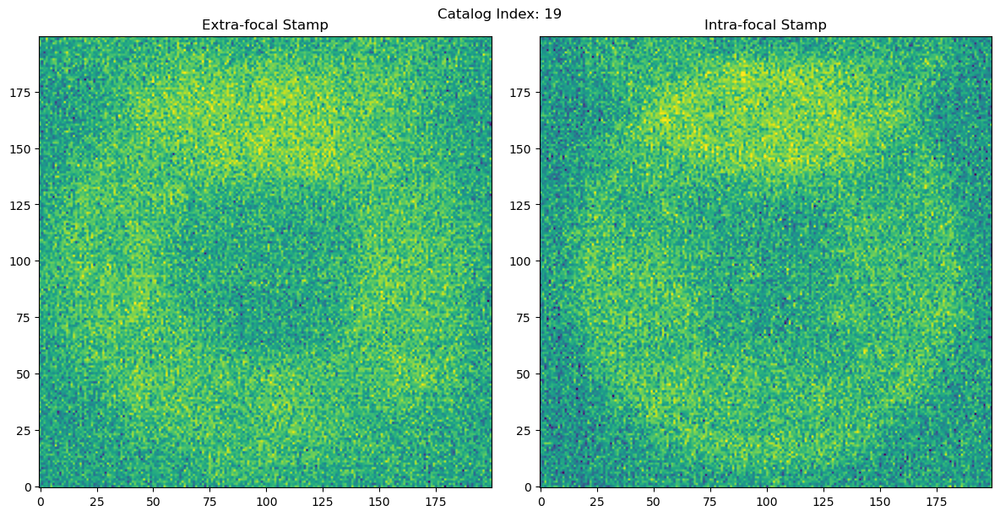

In [29]:
%matplotlib inline
fig = plt.figure(figsize=(12, 6))

fig.add_subplot(1,2,1)
zscale_extra = ZScaleInterval().get_limits(blendStampExtra.stamp_im.image.array)
plt.imshow(blendStampExtra.stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_extra[0], vmax=zscale_extra[1]), origin='lower')
plt.title('Extra-focal Stamp')

fig.add_subplot(1,2,2)
zscale_intra = ZScaleInterval().get_limits(blendStampIntra.stamp_im.image.array)
plt.imshow(blendStampIntra.stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_intra[0], vmax=zscale_intra[1]), origin='lower')
plt.title('Intra-focal Stamp')
    
plt.suptitle(f'Catalog Index: {blend_idx[0]}')
plt.tight_layout()

Our donut stamp for our blended object is well centered but does appear to be a faint object.
We can now start to run some tests on WEP performance with this data.

## Deblending Zernike Estimation Tests

We will now run the Zernike calculation step of the Wavefront Estimation Pipeline (WEP) under different scenarios on our blended source.

### Blended object with no deblending included in wavefront estimation

This first test will look at the performance of WEP on the blended object without running any deblending.

#### Create new Donut Stamps

The first step below is to create a version of the donut stamp that does not know about the blend.

For comparisons since we don't have the true wavefront we will also create a set of donut stamps and calculate Zernikes for the brightest 3 unblended sources and two faint, unblended sources around the same brightness as the blended donut.

In [30]:
# Create version of donutStamp for blended object that does not record blend
from lsst.ts.wep.task import DonutStamps

# First copy
noDeblendExtra = DonutStamps([copy(blendStampExtra)])
noDeblendIntra = DonutStamps([copy(blendStampIntra)])

# Erase blend_centroid_position from stamps
noDeblendExtra[0].blend_centroid_positions = np.array([[np.nan, np.nan]])
noDeblendIntra[0].blend_centroid_positions = np.array([[np.nan, np.nan]])

# Save brightest 3 unblended sources as a comparison for Zernike calculation
brightStampsExtra = DonutStamps(copy(stampsExtra[:3]))
brightStampsIntra = DonutStamps(copy(stampsIntra[:3]))

# Save two faint donuts without artifacts ranked in brightness next to the blended object for comparison
faintStampsExtra = DonutStamps([copy(stampsExtra[17])])
faintStampsIntra = DonutStamps([copy(stampsIntra[17])])
faintStampsExtra.append(copy(stampsExtra[21]))
faintStampsIntra.append(copy(stampsIntra[21]))

#### Run Zernike Estimation

In [31]:
from lsst.ts.wep.task import CalcZernikesTask, CalcZernikesTaskConfig

In [32]:
calcConfig = CalcZernikesTaskConfig()
# Set parameters for AuxTel
calcConfig.instObscuration = 0.3525
calcConfig.instFocalLength = 21.6
calcConfig.instApertureDiameter = 1.2
calcConfig.instDefocalOffset = 32.8
calcConfig.instPixelSize = 10.0e-6
calcConfig.opticalModel = 'onAxis'

In [33]:
calcTask = CalcZernikesTask(config=calcConfig)

In [34]:
brightZernOut = calcTask.run(brightStampsExtra, brightStampsIntra)
noDeblendZernOut = calcTask.run(noDeblendExtra, noDeblendIntra)
faintZernOut = calcTask.run(faintStampsExtra, faintStampsIntra)

In [35]:
brightZernRaw = brightZernOut.outputZernikesRaw
noDeblendZernRaw = noDeblendZernOut.outputZernikesRaw
faintZernRaw = faintZernOut.outputZernikesRaw

First let's compare our blended source (without running deblending) to the bright objects that we will use as our "truth".

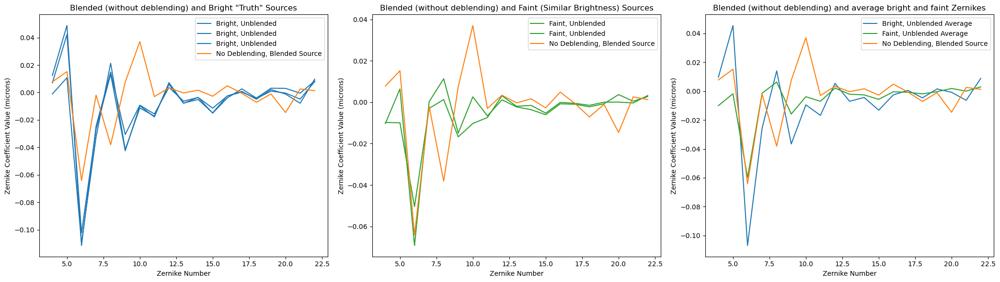

In [36]:
fig = plt.figure(figsize=(21, 6))

fig.add_subplot(1,3,1)
plt.plot(np.arange(4,23), brightZernRaw[0], label="Bright, Unblended", c='C0')
plt.plot(np.arange(4,23), brightZernRaw[1], label="Bright, Unblended", c='C0')
plt.plot(np.arange(4,23), brightZernRaw[2], label="Bright, Unblended", c='C0')
plt.plot(np.arange(4,23), noDeblendZernRaw[0], c='C1', label='No Deblending, Blended Source')
plt.legend()
plt.xlabel('Zernike Number')
plt.ylabel('Zernike Coefficient Value (microns)')
plt.title('Blended (without deblending) and Bright "Truth" Sources')

fig.add_subplot(1,3,2)
plt.plot(np.arange(4,23), faintZernRaw[0], label="Faint, Unblended", c='C2')
plt.plot(np.arange(4,23), faintZernRaw[1], label="Faint, Unblended", c='C2')
plt.plot(np.arange(4,23), noDeblendZernRaw[0], c='C1', label='No Deblending, Blended Source')
plt.legend()
plt.xlabel('Zernike Number')
plt.ylabel('Zernike Coefficient Value (microns)')
plt.title('Blended (without deblending) and Faint (Similar Brightness) Sources')

fig.add_subplot(1,3,3)
plt.plot(np.arange(4,23), brightZernOut.outputZernikesAvg, label="Bright, Unblended Average", c='C0')
plt.plot(np.arange(4,23), faintZernOut.outputZernikesAvg, label="Faint, Unblended Average", c='C2')
plt.plot(np.arange(4,23), noDeblendZernRaw[0], c='C1', label='No Deblending, Blended Source')
plt.legend()
plt.xlabel('Zernike Number')
plt.ylabel('Zernike Coefficient Value (microns)')
plt.title('Blended (without deblending) and average bright and faint Zernikes')

plt.tight_layout()

Here we see that our blended source has Zernike values siginificantly different from our "true" values which are pretty consistent with one another which we expect for bright, unblended objects on the same sensor.
We also have values closer to the faint sources but still a significantly different results from the unblended sources.
The faint sources in general seem to have a similar shape to the bright Zernikes but much lower signal.

### Look at deblender performance

Now we will run the Zernike estimation with the masked deblending turned on and assess the performance.

In [37]:
# First copy
deblendExtra = DonutStamps([copy(blendStampExtra)])
deblendIntra = DonutStamps([copy(blendStampIntra)])

In [38]:
# Find Zernikes with deblending
deblendZernOut = calcTask.run(deblendExtra, deblendIntra)

In [39]:
deblendZernRaw = deblendZernOut.outputZernikesRaw

Text(0.5, 1.0, 'Zernikes with and without deblending for blended object')

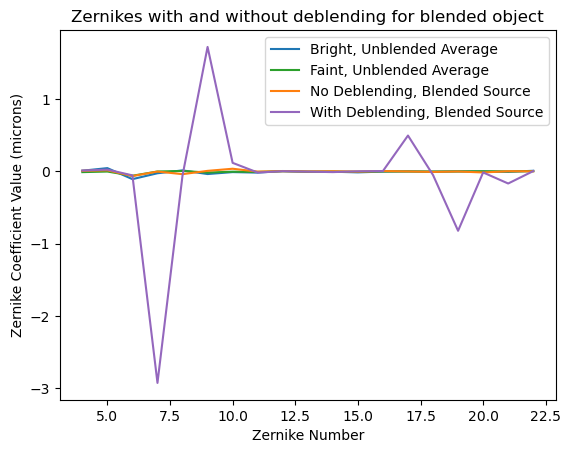

In [40]:
plt.plot(np.arange(4,23), brightZernOut.outputZernikesAvg, label="Bright, Unblended Average", c='C0')
plt.plot(np.arange(4,23), faintZernOut.outputZernikesAvg, label="Faint, Unblended Average", c='C2')
plt.plot(np.arange(4,23), noDeblendZernRaw[0], c='C1', label='No Deblending, Blended Source')
plt.plot(np.arange(4,23), deblendZernRaw[0], c='C4', label='With Deblending, Blended Source')
plt.legend()
plt.xlabel('Zernike Number')
plt.ylabel('Zernike Coefficient Value (microns)')
plt.title('Zernikes with and without deblending for blended object')

Our initial attempt at deblending is very poor and gives extreme values for the Zernike coefficients.
Let us take a look at the model masks applied during deblending to try and debug the issue.

##### Compare Blend to model

Text(0.5, 1.0, 'Intra-focal Stamp times Mask')

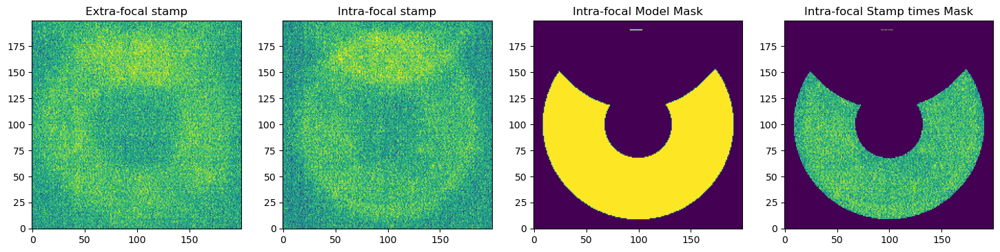

In [41]:
fig = plt.figure(figsize=(18, 6))

fig.add_subplot(1,4,1)
zscale_extra = ZScaleInterval().get_limits(deblendExtra[0].stamp_im.image.array)
plt.imshow(deblendExtra[0].stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_extra[0], vmax=zscale_extra[1]), origin='lower')
plt.title('Extra-focal stamp')

fig.add_subplot(1,4,2)
zscale_intra = ZScaleInterval().get_limits(deblendIntra[0].stamp_im.image.array)
plt.imshow(deblendIntra[0].stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_intra[0], vmax=zscale_intra[1]), origin='lower')
plt.title('Intra-focal stamp')

fig.add_subplot(1,4,3)
plt.imshow(deblendIntra[0].mask_pupil.array, origin='lower')
plt.title('Intra-focal Model Mask')

fig.add_subplot(1,4,4)
zscale_intra = ZScaleInterval().get_limits(deblendIntra[0].stamp_im.image.array)
plt.imshow(deblendIntra[0].mask_pupil.array * deblendIntra[0].stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_intra[0], vmax=zscale_intra[1]), origin='lower')
plt.title('Intra-focal Stamp times Mask')

We know there are issues with the masked deblender when the masked area breaks through to the middle of the central donut and that is what we see here. 
However, it does look like there is a slight mismatch in the location of the mask compared to the location of the blended donut from our catalog. 
Therefore, to try and do a better comparison we will manually move the location of the blended object in the catalog to get a mask that more accurately maps onto the blend.

### Test with shifted mask

Here we will create a new catalog where the location of the blend source relative to our central source is shifted away from the centroid of the central source to better match the location we see in the donut stamp images.

#### Create new stamp

In [42]:
shiftedCat = auxTelCat.copy()
blendListCopy = deepcopy(shiftedCat.iloc[19]['blend_centroid_y'])
blendListCopy[0] += 20
shiftedCat.loc[19, 'blend_centroid_y'] = [blendListCopy]

In [43]:
shiftedDonuts = cutOutTask.run([copy(postIsrExtra), copy(postIsrIntra)], [shiftedCat, shiftedCat], camera)

In [44]:
# First copy
shiftedMaskDeblendExtra = DonutStamps([shiftedDonuts.donutStampsExtra[19]])
shiftedMaskDeblendIntra = DonutStamps([shiftedDonuts.donutStampsIntra[19]])

Text(0.5, 1.0, 'Shifted Intra-focal Stamp times Mask')

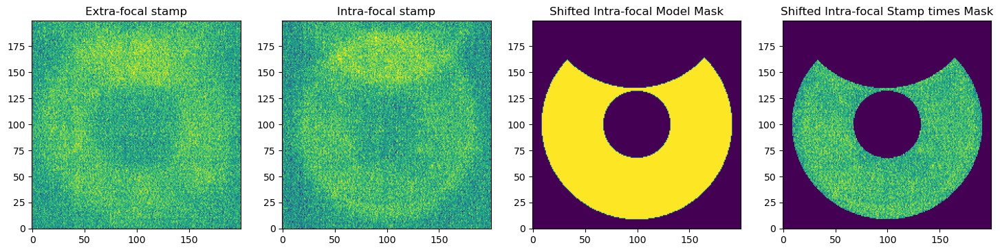

In [45]:
fig = plt.figure(figsize=(18, 6))

fig.add_subplot(1,4,1)
zscale_extra = ZScaleInterval().get_limits(shiftedMaskDeblendExtra[0].stamp_im.image.array)
plt.imshow(shiftedMaskDeblendExtra[0].stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_extra[0], vmax=zscale_extra[1]), origin='lower')
plt.title('Extra-focal stamp')

fig.add_subplot(1,4,2)
zscale_intra = ZScaleInterval().get_limits(shiftedMaskDeblendIntra[0].stamp_im.image.array)
plt.imshow(shiftedMaskDeblendIntra[0].stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_intra[0], vmax=zscale_intra[1]), origin='lower')
plt.title('Intra-focal stamp')

fig.add_subplot(1,4,3)
plt.imshow(shiftedMaskDeblendIntra[0].mask_pupil.array, origin='lower')
plt.title('Shifted Intra-focal Model Mask')

fig.add_subplot(1,4,4)
zscale_intra = ZScaleInterval().get_limits(shiftedMaskDeblendIntra[0].stamp_im.image.array)
plt.imshow(shiftedMaskDeblendIntra[0].mask_pupil.array * shiftedMaskDeblendIntra[0].stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_intra[0], vmax=zscale_intra[1]), origin='lower')
plt.title('Shifted Intra-focal Stamp times Mask')

This looks like a better match to the location we see in the postage stamp.

#### Calculate Zernikes

In [46]:
# Find Zernikes with deblending
shiftedMaskZernOut = calcTask.run(shiftedMaskDeblendExtra, shiftedMaskDeblendIntra)

In [47]:
shiftedMaskZernRaw = shiftedMaskZernOut.outputZernikesRaw

Text(0.5, 1.0, 'Comparing newly shifted mask to no deblending')

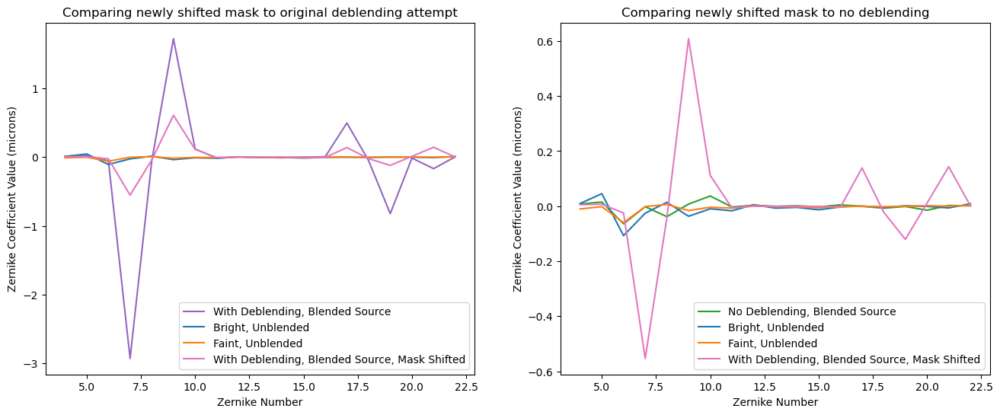

In [48]:
fig = plt.figure(figsize=(16, 6))

fig.add_subplot(1,2,1)
plt.plot(np.arange(4,23), deblendZernRaw[0], c='C4', label='With Deblending, Blended Source')
plt.plot(np.arange(4,23), brightZernOut.outputZernikesAvg, label="Bright, Unblended", c='C0')
plt.plot(np.arange(4,23), faintZernOut.outputZernikesAvg, label="Faint, Unblended", c='C1')
plt.plot(np.arange(4,23), shiftedMaskZernRaw[0], c='C6', label='With Deblending, Blended Source, Mask Shifted')
plt.legend()
plt.xlabel('Zernike Number')
plt.ylabel('Zernike Coefficient Value (microns)')
plt.title('Comparing newly shifted mask to original deblending attempt')

fig.add_subplot(1,2,2)
plt.plot(np.arange(4,23), noDeblendZernRaw[0], c='C2', label='No Deblending, Blended Source')
plt.plot(np.arange(4,23), brightZernOut.outputZernikesAvg, label="Bright, Unblended", c='C0')
plt.plot(np.arange(4,23), faintZernOut.outputZernikesAvg, label="Faint, Unblended", c='C1')
plt.plot(np.arange(4,23), shiftedMaskZernRaw[0], c='C6', label='With Deblending, Blended Source, Mask Shifted')
plt.legend()
plt.xlabel('Zernike Number')
plt.ylabel('Zernike Coefficient Value (microns)')
plt.title('Comparing newly shifted mask to no deblending')

The shifted mask is less extreme than before but that is probably just because it masks out less area.
It is still far from an effective deblending result as the right plot shows.

In order to get a better understanding of whether the masked deblending can still be effective let's try to run it on the bright, central source in our images and mask out different portions of the donut as if we were masking out a blended source.

### Look at how masked deblending affects bright donut at different masking fractions

#### Create a new catalog of "blended" sources

Here we create a catalog of copies of the central source with artificial values for the blend centroids that mask different fractions of the central donut.

In [49]:
brightMaskCat = pd.DataFrame(columns=auxTelCat.columns)

In [50]:
for i in range(6):
    brightShiftRow = deepcopy(auxTelCat.iloc[0])
    centroidY = brightShiftRow['centroid_y']
    centroidX = brightShiftRow['centroid_x']
    brightShiftRow['blend_centroid_x'] = [centroidX]
    brightShiftRow['blend_centroid_y'] = [centroidY + 130 + i*10]
    brightMaskCat = pd.concat([brightMaskCat, pd.DataFrame(brightShiftRow).transpose()])

In [51]:
brightMaskCat = brightMaskCat.convert_dtypes()

In [52]:
brightMaskDonuts = cutOutTask.run([copy(postIsrExtra), copy(postIsrIntra)], [brightMaskCat, brightMaskCat], camera)

In [53]:
brightMaskDonutsExtra = brightMaskDonuts.donutStampsExtra
brightMaskDonutsIntra = brightMaskDonuts.donutStampsIntra

Let's take a quick look at one of these artifically blended stamps.

Text(0.5, 1.0, 'Intra-focal Stamp times Mask')

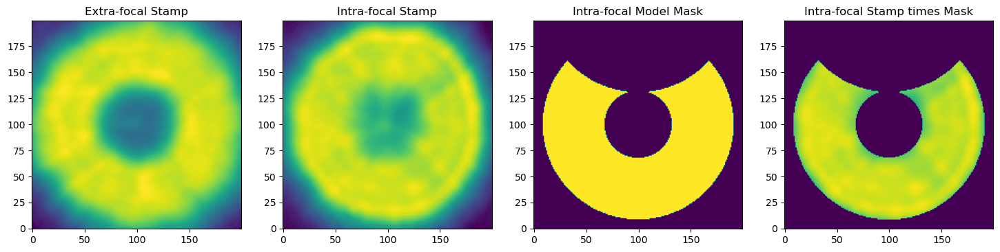

In [54]:
fig = plt.figure(figsize=(18, 6))

fig.add_subplot(1,4,1)
zscale_extra = ZScaleInterval().get_limits(brightMaskDonutsExtra[0].stamp_im.image.array)
plt.imshow(brightMaskDonutsExtra[0].stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_extra[0], vmax=zscale_extra[1]), origin='lower')
plt.title('Extra-focal Stamp')

fig.add_subplot(1,4,2)
zscale_intra = ZScaleInterval().get_limits(brightMaskDonutsIntra[0].stamp_im.image.array)
plt.imshow(brightMaskDonutsIntra[0].stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_intra[0], vmax=zscale_intra[1]), origin='lower')
plt.title('Intra-focal Stamp')

fig.add_subplot(1,4,3)
plt.imshow(brightMaskDonutsIntra[0].mask_pupil.array, origin='lower')
plt.title('Intra-focal Model Mask')

fig.add_subplot(1,4,4)
zscale_intra = ZScaleInterval().get_limits(brightMaskDonutsIntra[0].stamp_im.image.array)
plt.imshow(brightMaskDonutsIntra[0].mask_pupil.array * brightMaskDonutsIntra[0].stamp_im.image.array, norm=mpl.colors.AsinhNorm(vmin=zscale_intra[0], vmax=zscale_intra[1]), origin='lower')
plt.title('Intra-focal Stamp times Mask')

Below we show the different masking fractions for the donuts.

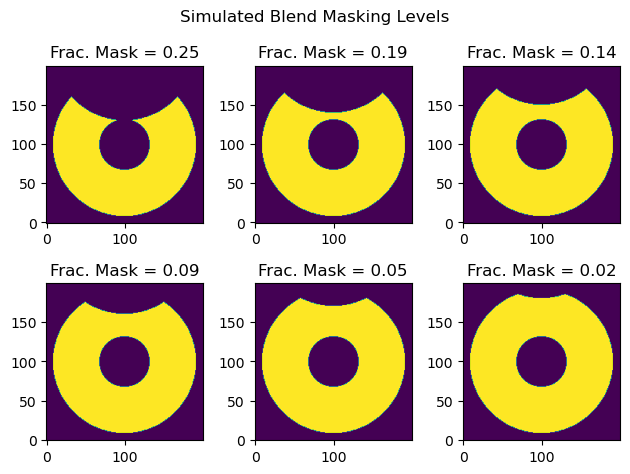

In [55]:
fig = plt.figure()
fracMasked = []

for i in range(6):
    fig.add_subplot(2,3,i+1)
    plt.imshow(brightMaskDonutsIntra[i].mask_pupil.array, origin='lower')
    fracMasked.append(1.0 - np.sum(brightMaskDonutsIntra[i].mask_pupil.array)/np.sum(stampsIntra[0].mask_pupil.array))
    plt.title(f'Frac. Mask = {fracMasked[i]:.2f}')
plt.suptitle('Simulated Blend Masking Levels')
plt.tight_layout()

#### Calculate Zernikes

In [56]:
# Find Zernikes with deblending
brightMaskZernOut = calcTask.run(brightMaskDonutsExtra, brightMaskDonutsIntra)

In [57]:
brightMaskZernRaw = brightMaskZernOut.outputZernikesRaw

Text(0.5, 1.0, 'Difference from Unblended Wavefront')

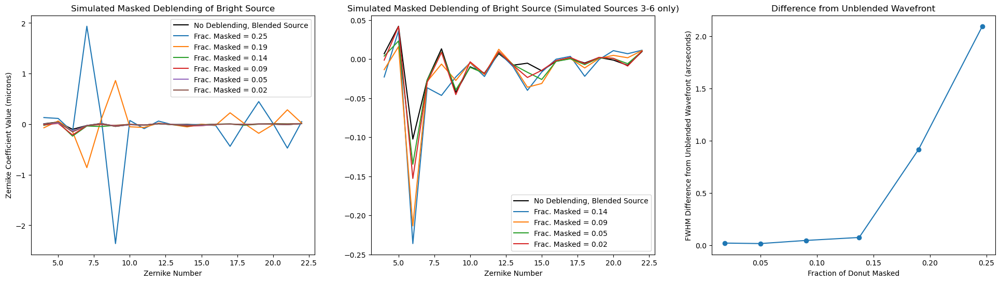

In [58]:
fig = plt.figure(figsize=(24, 6))

fig.add_subplot(1,3,1)
plt.plot(np.arange(4,23), brightZernRaw[0], c='k', label='No Deblending, Blended Source')
for i in range(6):
    plt.plot(np.arange(4, 23), brightMaskZernRaw[i], label=f'Frac. Masked = {fracMasked[i]:.2f}')
plt.legend()
plt.xlabel('Zernike Number')
plt.ylabel('Zernike Coefficient Value (microns)')
plt.title('Simulated Masked Deblending of Bright Source')

fig.add_subplot(1,3,2)
plt.plot(np.arange(4,23), brightZernRaw[0], c='k', label='No Deblending, Blended Source')
for i in range(2, 6):
    plt.plot(np.arange(4, 23), brightMaskZernRaw[i], label=f'Frac. Masked = {fracMasked[i]:.2f}')
plt.legend()
plt.xlabel('Zernike Number')
plt.title('Simulated Masked Deblending of Bright Source (Simulated Sources 3-6 only)')

fig.add_subplot(1,3,3)
psfContributionMaskZern = []
for i in range(6):
    psfContributionMaskZern.append(np.sqrt(np.sum(ConvertZernikesToPsfWidth(brightMaskZernRaw[i] - brightZernRaw[0])**2)))
plt.plot(fracMasked, psfContributionMaskZern, '-o')
plt.xlabel('Fraction of Donut Masked')
plt.ylabel('FWHM Difference from Unblended Wavefront (arcseconds)')
plt.title('Difference from Unblended Wavefront')

Here we see that even the bright source has issues with the masked deblender at the fractions of blending we saw with our faint stamp.
What is happening here is an effect due to using the masked deblending on the science images and we will examine it in the next section.

#### Blending on defocused science sensors

When the science sensors are pistoned from one side of focus the donut centroids remain in the same place on the focal plane.
However the photons from a certain part of the wavefront are actually rotated around 180 degrees between the intra-focal and extra-focal images.
That is why the extra-focal donut must be rotated in the WEP code.
When this happens it means that we have to block the blended section of the central source on each side of the donut reducing the available area for wavefront estimation by 2x.
The images below help to illustrate this effect.

In [59]:
Image(url='../../../notebook_figures/mask_rotate_1.jpg')

In [60]:
Image(url='../../../notebook_figures/mask_rotate_2.jpg')

Because of this effect we have the following when we need to mask out both the intra and extra-focal donuts.

Text(0.5, 1.0, 'Combined Mask used in WEP')

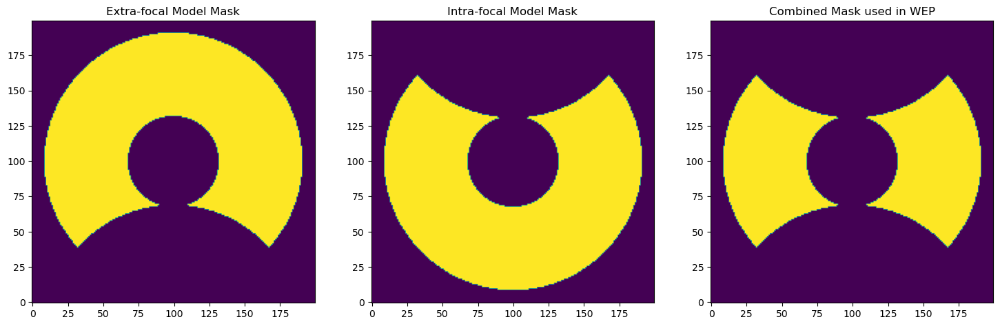

In [61]:
fig = plt.figure(figsize=(18, 6))

fig.add_subplot(1,3,1)
plt.imshow(brightMaskDonutsExtra[0].mask_pupil.array, origin='lower')
plt.title('Extra-focal Model Mask')

fig.add_subplot(1,3,2)
plt.imshow(brightMaskDonutsIntra[0].mask_pupil.array, origin='lower')
plt.title('Intra-focal Model Mask')

fig.add_subplot(1,3,3)
plt.imshow(brightMaskDonutsIntra[0].mask_pupil.array * brightMaskDonutsExtra[0].mask_pupil.array, origin='lower')
plt.title('Combined Mask used in WEP')

Above we see that we completely lose information along one axis of the wavefront.
Using the figure below and looking at the Zernike polynomials we use in WEP this helps explain why Z7 and Z9 in the test above perform so poorly.
Z7 and Z9 have the greatest reliance upon the data that we have masked out.

In [62]:
Image(url='https://sitcomtn-003.lsst.io/_images/aZernikes.png')

An important thing to note is that when we use the Corner Wavefront Sensors (CWFS) on LSSTCam we have stars in different locations for the extra-focal and intra-focal images.
While this presents other problems it means that when we have a blended source in one image we can pair it with an unblended source in the other image.
As a result we only have masking on one side of the donut and do not lose wavefront information from both sides.
To show how the masked deblending works in this scenario we can simulate a blended source on only the intra-focal images in the next section.

### Bright Mask with only one side masked

Here we will mask only the intra-focal stamps and evaluate the performance of the WEP code.

#### Create new set of stamps

In [63]:
brightUnmaskedCat = pd.DataFrame(columns=auxTelCat.columns)

In [64]:
for i in range(6):
    brightShiftRow = deepcopy(auxTelCat.iloc[0])
    brightUnmaskedCat = pd.concat([brightUnmaskedCat, pd.DataFrame(brightShiftRow).transpose()])

In [65]:
brightUnmaskedCat = brightUnmaskedCat.convert_dtypes()

In [66]:
brightHalfMaskDonuts = cutOutTask.run([copy(postIsrExtra), copy(postIsrIntra)], [brightUnmaskedCat, brightMaskCat], camera)

In [67]:
brightHalfMaskDonutsExtra = brightHalfMaskDonuts.donutStampsExtra
brightHalfMaskDonutsIntra = brightHalfMaskDonuts.donutStampsIntra

#### Calculate Zernikes

In [68]:
# Find Zernikes with deblending
brightHalfMaskZernOut = calcTask.run(brightHalfMaskDonutsExtra, brightHalfMaskDonutsIntra)

In [69]:
brightHalfMaskZernRaw = brightHalfMaskZernOut.outputZernikesRaw

(0.0, 0.1)

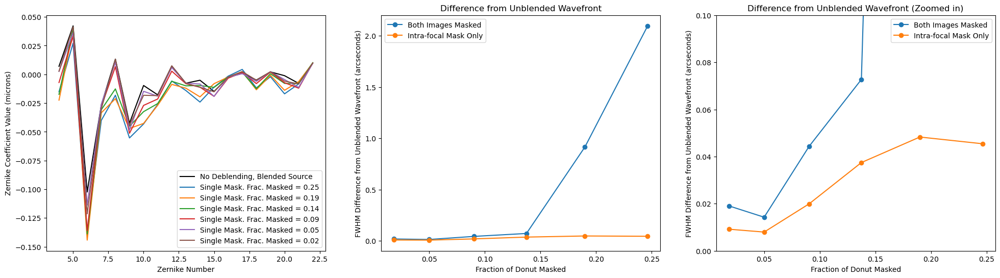

In [70]:
fig = plt.figure(figsize=(24,6))

fig.add_subplot(1,3,1)
plt.plot(np.arange(4,23), brightZernRaw[0], c='k', label='No Deblending, Blended Source')
for i in range(6):
    plt.plot(np.arange(4, 23), brightHalfMaskZernRaw[i], label=f'Single Mask. Frac. Masked = {fracMasked[i]:.2f}')
plt.legend()
plt.xlabel('Zernike Number')
plt.ylabel('Zernike Coefficient Value (microns)')

fig.add_subplot(1,3,2)
psfContributionHalfMaskZern = []
for i in range(6):
    psfContributionHalfMaskZern.append(np.sqrt(np.sum(ConvertZernikesToPsfWidth(brightHalfMaskZernRaw[i] - brightZernRaw[0])**2)))
plt.plot(fracMasked, psfContributionMaskZern, '-o', label='Both Images Masked')
plt.plot(fracMasked, psfContributionHalfMaskZern, '-o', label='Intra-focal Mask Only')
plt.xlabel('Fraction of Donut Masked')
plt.ylabel('FWHM Difference from Unblended Wavefront (arcseconds)')
plt.legend()
plt.title('Difference from Unblended Wavefront')

fig.add_subplot(1,3,3)
plt.plot(fracMasked, psfContributionMaskZern, '-o', label='Both Images Masked')
plt.plot(fracMasked, psfContributionHalfMaskZern, '-o', label='Intra-focal Mask Only')
plt.xlabel('Fraction of Donut Masked')
plt.ylabel('FWHM Difference from Unblended Wavefront (arcseconds)')
plt.legend()
plt.title('Difference from Unblended Wavefront (Zoomed in)')
plt.ylim((0, 0.1))

Evaluating the performance of the masked deblender on this dataset we see that the deviations from the "truth" are much smaller and show that the masked deblender can work when applied to the wavefront sensors.
Looking at the third panel comparing the performance on a single image masked versus both images being masked we see that we can lose ~25% of the image to a blend with the wavefront sensors and perform as well as if we lost 9% of a blend in the science sensors.

## Summary

Unfortunately the AuxTel data we gathered did not provide us with a bright, blended donut as we hoped and this limited the usefulness of the actual data.
But this dataset did serve as a useful demonstration dataset to explore issues with the masked deblending when applied to the science sensors as opposed to when we apply it to the wavefront sensors.
If we wish to use AuxTel data again to evaluate the performance of masked deblending we will have to make sure we have bright central donuts with a blend and most useful would be multiple blends with different masking fractions required.